## Different Types of Noise:

### Gaussian Noise:
Gaussian Noise is a statistical noise having a probability density function equal to normal distribution, also known as Gaussian Distribution. Random Gaussian function is added to Image function to generate this noise. It is also called as electronic noise because it arises in amplifiers or detectors. Source: thermal vibration of atoms and discrete nature of radiation of warm objects.
The magnitude of Gaussian Noise depends on the Standard Deviation(sigma). Noise Magnitude is directly proportional to the sigma value.

### Salt and Pepper Noise:
Salt and Pepper noise is added to an image by addition of both random bright (with 255 pixel value) and random dark (with 0 pixel value) all over the image.This model is also known as data drop noise because statistically it drop the original data values [5]. Source: Malfunctioning of camera’s sensor cell.

### Speckle Noise:
A fundamental problem in optical and digital holography is the presence of speckle noise in the image reconstruction process. Speckle is a granular noise that inherently exists in an image and degrades its quality. Speckle noise can be generated by multiplying random pixel values with different pixels of an image.

### Poisson Noise:
The appearance of this noise is seen due to the statistical nature of electromagnetic waves such as x-rays, visible lights and gamma rays. The x-ray and gamma ray sources emitted number of photons per unit time. These rays are injected in patient’s body from its source, in medical x rays and gamma rays imaging systems. These sources are having random fluctuation of photons. Result gathered image has spatial and temporal randomness. This noise is also called as quantum (photon) noise or shot noise.




## Loading a Sample MRI image

In [ ]:
from google.colab import files
t_image = files.upload()

Saving MRI_Head_Brain_Normal.jpg to MRI_Head_Brain_Normal.jpg


## Gaussian Noise

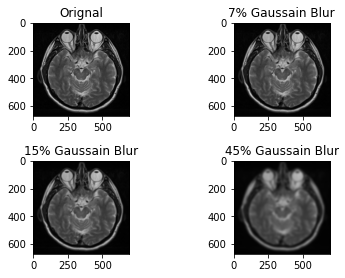

In [ ]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread('MRI_Head_Brain_Normal.jpg')
g_1 = cv2.GaussianBlur(image, (7,7), 0)
g_2 = cv2.GaussianBlur(image, (15,15), 0)
g_3 = cv2.GaussianBlur(image, (45,45), 0)



plt.subplot(2,2,1),plt.imshow(image),plt.title("Orignal")
plt.subplot(2,2,2),plt.imshow(g_1),plt.title("7% Gaussain Blur")
plt.subplot(2,2,3),plt.imshow(g_2),plt.title("15% Gaussain Blur")
plt.subplot(2,2,4),plt.imshow(g_3),plt.title("45% Gaussain Blur")

plt.tight_layout(pad = 1.2)

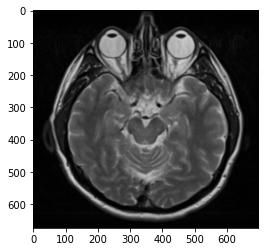

In [ ]:
plt.imshow(g_1)

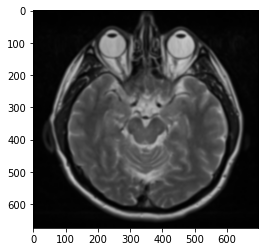

In [ ]:
plt.imshow(g_2)

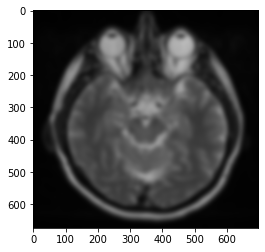

In [ ]:
plt.imshow(g_3)

## Salt and Pepper Noise

In [ ]:
import random

def sp_noise(image,prob):

    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

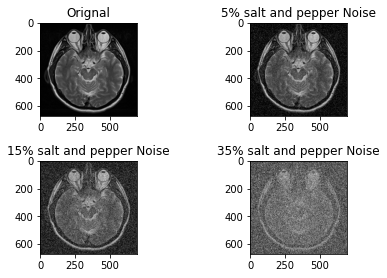

In [ ]:
plt.subplot(2,2,1),plt.imshow(image),plt.title("Orignal")
plt.subplot(2,2,2),plt.imshow(sp_1),plt.title("5% salt and pepper Noise")
plt.subplot(2,2,3),plt.imshow(sp_2),plt.title("15% salt and pepper Noise")
plt.subplot(2,2,4),plt.imshow(sp_3),plt.title("35% salt and pepper Noise")

plt.tight_layout(pad = 1.2)

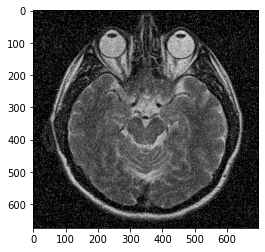

In [ ]:
sp_1 = sp_noise(image, 0.05)
plt.imshow(sp_1)

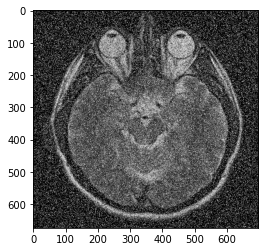

In [ ]:
sp_2 = sp_noise(image, 0.15)
plt.imshow(sp_2)

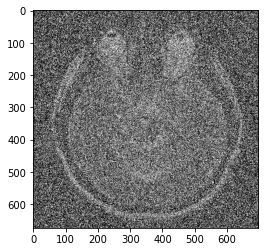

In [ ]:
sp_3 = sp_noise(image, 0.35)
plt.imshow(sp_3)

## Speckle Noise

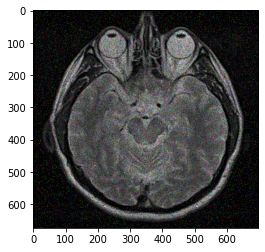

In [ ]:
gauss = np.random.normal(0,1,image.size)
gauss = gauss.reshape(image.shape[0],image.shape[1],image.shape[2]).astype('uint8')
s_1 = image + image * gauss
plt.imshow(s_1)

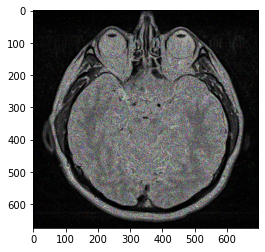

In [ ]:
gauss = np.random.normal(1,1,image.size)
gauss = gauss.reshape(image.shape[0],image.shape[1],image.shape[2]).astype('uint8')
s_2 = image + image * gauss
plt.imshow(s_2)

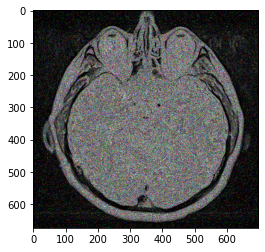

In [ ]:
gauss = np.random.normal(2,2,image.size)
gauss = gauss.reshape(image.shape[0],image.shape[1],image.shape[2]).astype('uint8')
s_3 = image + image * gauss
plt.imshow(s_3)

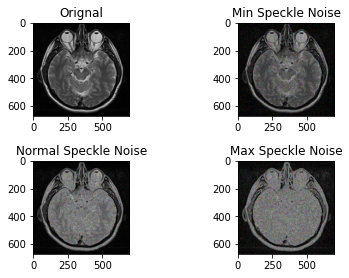

In [ ]:
plt.subplot(2,2,1),plt.imshow(image),plt.title("Orignal")
plt.subplot(2,2,2),plt.imshow(s_1),plt.title("Min Speckle Noise")
plt.subplot(2,2,3),plt.imshow(s_2),plt.title("Normal Speckle Noise")
plt.subplot(2,2,4),plt.imshow(s_3),plt.title("Max Speckle Noise")

plt.tight_layout(pad = 1.2)

## Poisson Noise

In [ ]:
def poisson_noise(image, param):
   noise = np.random.poisson(50, image.shape)
   output = image + noise*param
   return output

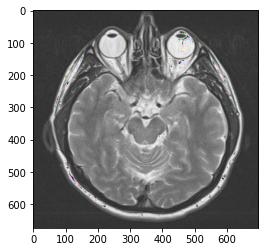

In [ ]:
p_1 = poisson_noise(image,1).astype(np.uint8)
plt.imshow(p_1)

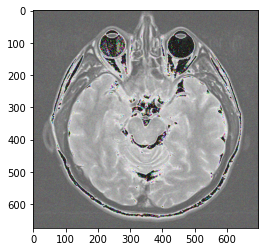

In [ ]:
p_2 = poisson_noise(image, 2).astype(np.uint8)
plt.imshow(p_2)

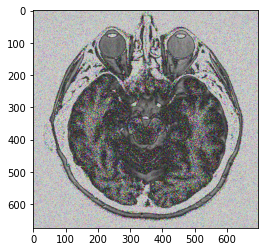

In [ ]:
p_3 = poisson_noise(image,4).astype(np.uint8)
plt.imshow(p_3)

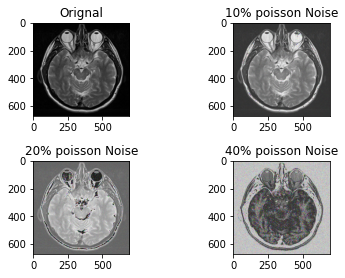

In [ ]:
plt.subplot(2,2,1),plt.imshow(image),plt.title("Orignal")
plt.subplot(2,2,2),plt.imshow(p_1),plt.title("10% poisson Noise")
plt.subplot(2,2,3),plt.imshow(p_2),plt.title("20% poisson Noise")
plt.subplot(2,2,4),plt.imshow(p_3),plt.title("40% poisson Noise")

plt.tight_layout(pad = 1.2)

In [ ]:
img_list = [image,g_1,g_2,g_3, sp_1,sp_2,sp_3,s_1,s_2,s_3,p_1,p_3,p_3]
print(len(img_list))

13


# Filters

Some different types of Filters are:

### Min Filter
The transformation replaces the central pixel with the darkest one in the running window. For example, if you have text that is lightly printed, the minimum filter makes letters thicker.

### Max Filter
The maximum and minimum filters are shift-invariant. Whereas the minimum filter replaces the central pixel with the darkest one in the running window, the maximum filter replaces it with the lightest one. For example, if you have a text string drawn with a thick pen, you can make the sign skinnier.

### Adaptive Weiner Filter (Freq Domain)
Adaptive Wiener Filter (AWF) is considering frequency domain filter. The adaptive Wiener filter changes its behavior based on the statistical characteristics of the MR image inside the filter region, which is defined by the maximum rectangular window. Adaptive filter performance is commonly superior to non-adaptive counterparts. Mean and variance are two important mathematics measures using which adaptive filters can be designed [13].
The adaptive Wiener filter uses a pixel-wise adaptive Wiener method based on statistics estimated from a local neighborhood of each pixel. Its function filters the MR image using pixel-wise adaptive Wiener filtering, using neighborhoods of size M-by-N to estimate the local MR image mean and standard deviation.

### Median Filter (Non linear spatial domain)
The median filter is a very popular image transformation which allows the preserving of edges while removing noise.Just like in morphological image processing, the median filter processes the image in the running window with a specified radius, and the transformation makes the target pixel luminosity equal to the mean value in the running window. This filter works well for removing noise, especially impulse noise

### Wavelet Domain Filter
Wavelet denoising relies on the wavelet representation of the image. Gaussian noise tends to be represented by small values in the wavelet domain and can be removed by setting coefficients below a given threshold to zero (hard thresholding) or shrinking all coefficients toward zero by a given amount (soft thresholding).


### Adaptive Median Filter
The adaptive Median filter executes spatial processing to determine which pixels in an MR image have been affected by noise. The Adaptive Median Filter classifies pixels as noise by comparison each pixel in the MR image to its surrounding neighbor pixels. The size of the neighborhood window is adjustable, as well as the threshold for the comparison. A pixel that is different from a majority of its neighbors, as well as being not structurally aligned with those pixels to which it is similar, is labeled as noisy pixel. These noisy pixels are then exchange by the median value of the pixels in the neighborhood that have passed the noise labeling test. Adaptive median filter changes the size of the neighborhood window through operation. But, in classic median filter; the neighborhood window is constant through the operation. For that, the standard median filter does not perform well when the impulse noise density is high, while the adaptive median filter can better handle these noises. Also, the adaptive median filter preserves MR image details such as edges and smooth non-impulsive noise, while the standard median filter does not.

### Gaussian Filter
A Gaussian Filter is a low pass filter used for reducing noise (high frequency components) and blurring regions of an image. The filter is implemented as an Odd sized Symmetric Kernel (DIP version of a Matrix) which is passed through each pixel of the Region of Interest to get the desired effect. The kernel is not hard towards drastic color changed (edges) due to it the pixels towards the center of the kernel having more weightage towards the final value then the periphery. A Gaussian Filter could be considered as an approximation of the Gaussian Function (mathematics)

### Arithmetic Mean Filter
Replaces the central pixel value with the average of all the values in the window.

### Bilatrel Filter
A bilateral filter is a non-linear, edge-preserving, and noise-reducing smoothing filter for images. It replaces the intensity of each pixel with a weighted average of intensity values from nearby pixels. This weight can be based on a Gaussian distribution. Crucially, the weights depend not only on Euclidean distance of pixels, but also on the radiometric differences (e.g., range differences, such as color intensity, depth distance, etc.). This preserves sharp edges.

### Noise Adaptive Fuzzy switching median Filter (NAFSM)


### Speckle Reducing Diffusion Filter (SRAD)


## Min Filter

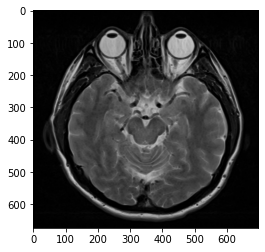

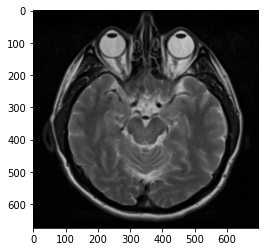

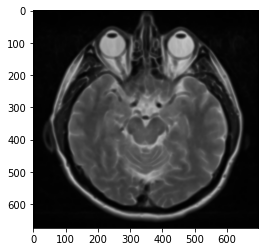

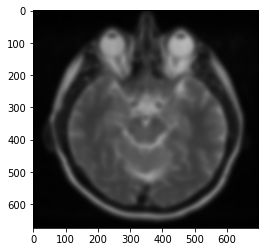

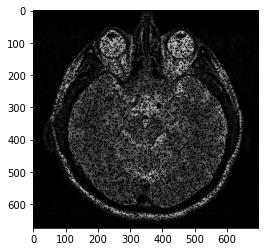

...

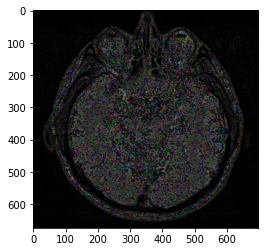

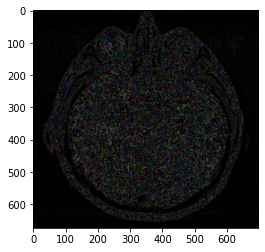

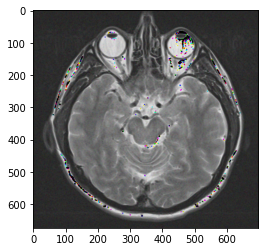

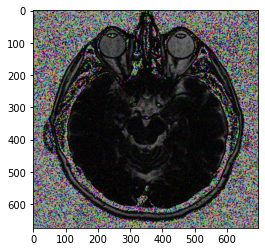

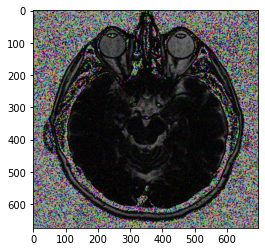

In [ ]:
k = len(img_list)
ref_psnr_values_min = [ ]
for i in range(k):
  size = (3, 3)
  shape = cv2.MORPH_RECT
  kernel = cv2.getStructuringElement(shape, size)
  min_image = cv2.erode(img_list[i], kernel)
  x = peak_signal_noise_ratio(image,min_image)
  ref_psnr_values_min.append(x)
  plt.figure()
  plt.imshow(min_image)

plt.show()

## Max Filter

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


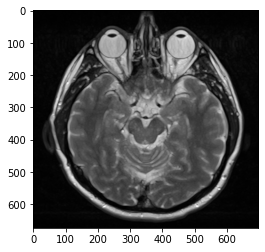

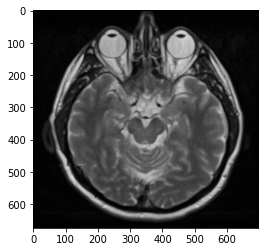

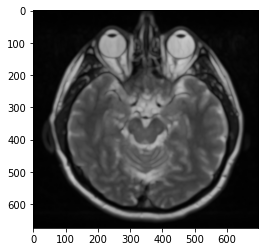

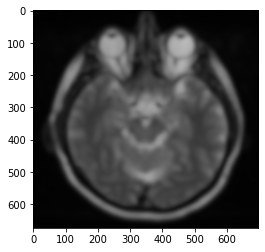

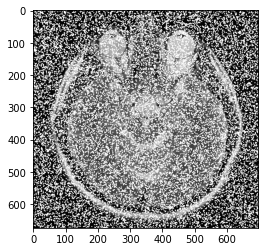

...

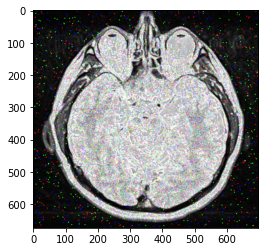

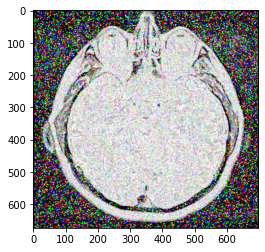

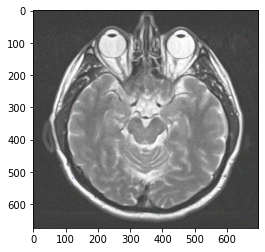

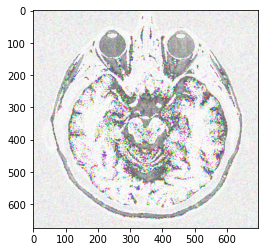

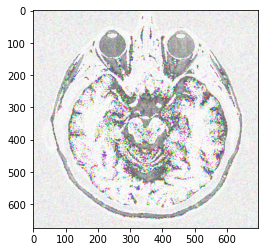

In [ ]:
k = len(img_list)
ref_psnr_values_max = [ ]

for i in range(k):
  size = (3, 3)
  shape = cv2.MORPH_RECT
  kernel = cv2.getStructuringElement(shape, size)
  max_image = cv2.dilate(img_list[i], kernel)
  print(type(max_image))
  x = peak_signal_noise_ratio(image,max_image)
  ref_psnr_values_max.append(x)
  plt.figure()
  plt.imshow(max_image)

plt.show()

## Adaptive Weiner Filter

In [ ]:
def gaussian_kernel(kernel_size = 3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

In [ ]:
from numpy.fft import fft2, ifft2
from scipy.signal import gaussian, convolve2d

def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy)
    kernel = fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

In [ ]:
rgb2gray(image).shape, filtered_img.shape

((673, 697), (673, 697))

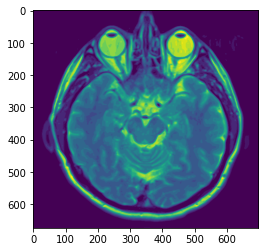

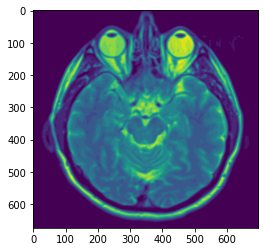

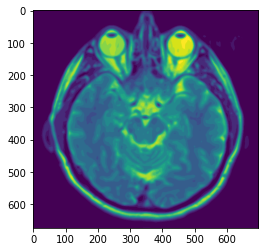

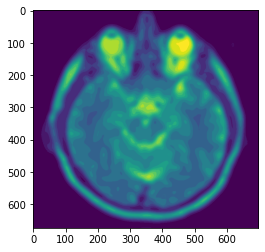

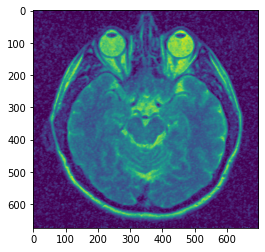

...

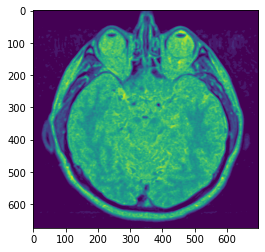

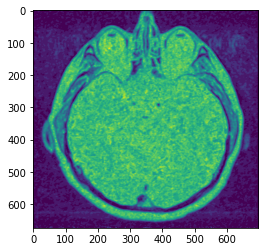

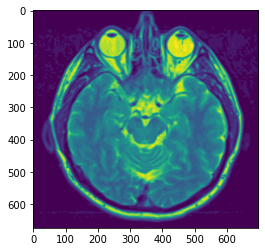

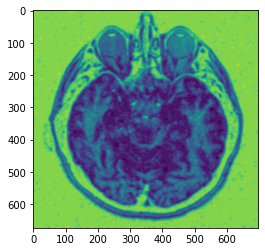

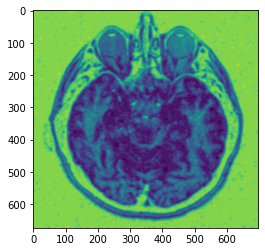

In [ ]:
k = len(img_list)
ref_psnr_values_ad_weiner = [ ]
kernel = gaussian_kernel(3)

for i in range(k):
  filtered_img = wiener_filter(rgb2gray(img_list[i]), kernel, K = 10).astype(np.uint8)
  grayimg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  x = cv2.PSNR(grayimg, filtered_img)
  ref_psnr_values_ad_weiner.append(x)
  plt.figure()
  plt.imshow(filtered_img)

plt.show()

## Median Filter

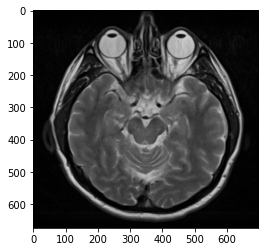

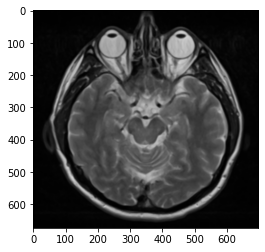

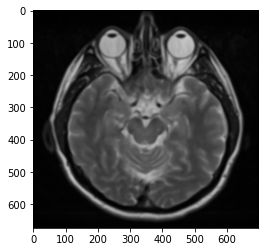

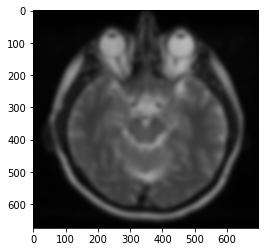

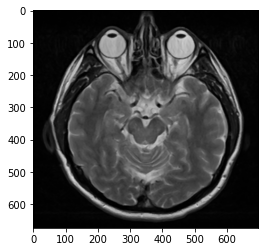

...

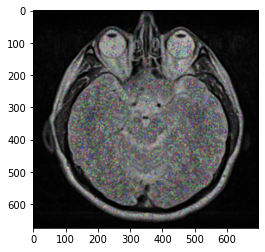

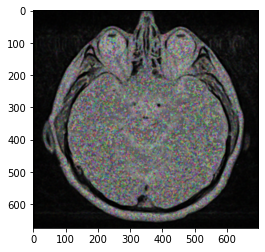

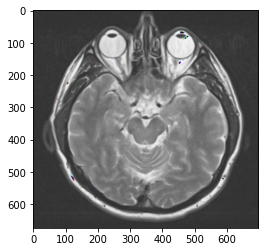

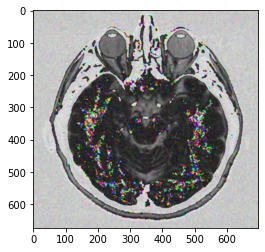

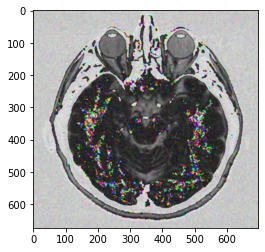

In [ ]:
k = len(img_list)
ref_psnr_values_median = [ ]
for i in range(k):
  img_median = cv2.medianBlur(img_list[i], 5) # Add median filter to image
  x = peak_signal_noise_ratio(image,img_median)
  ref_psnr_values_median.append(x)
  plt.figure()
  plt.imshow(img_median)

plt.show()
  

## Mean

In [ ]:
def meanFilter(im):
    img = im
    w = 2

    for i in range(2,im.shape[0]-2):
        for j in range(2,im.shape[1]-2):
            block = im[i-w:i+w+1, j-w:j+w+1]
            m = np.mean(block,dtype=np.float32)
            img[i][j] = int(m)
    return img

/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


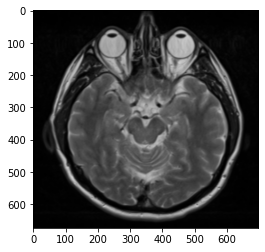

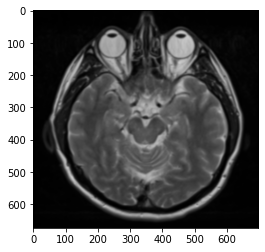

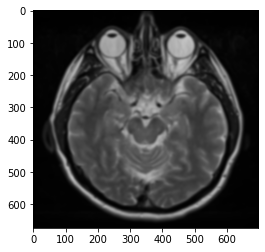

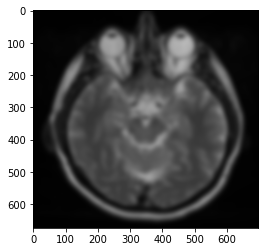

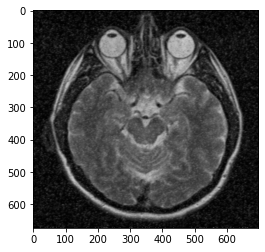

...

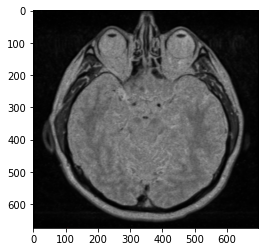

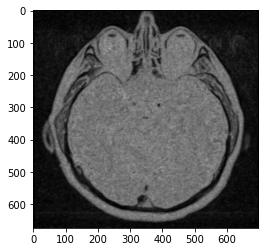

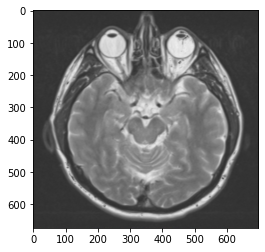

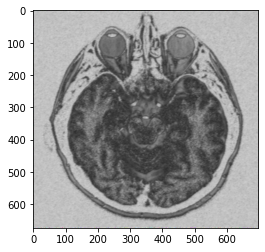

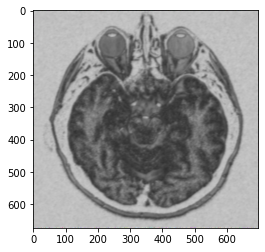

In [ ]:
k = len(img_list)
ref_psnr_values_mean = [ ]

for i in range(k):
  img_mean = meanFilter(img_list[i]) # Add mean filter to image
  x = peak_signal_noise_ratio(image,img_mean)
  ref_psnr_values_mean.append(x)
  plt.figure()
  plt.imshow(img_mean)

plt.show()

## Bilatrel Filter

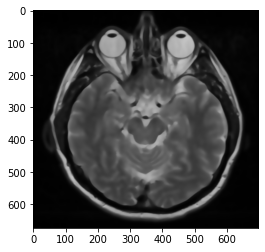

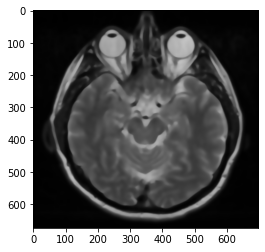

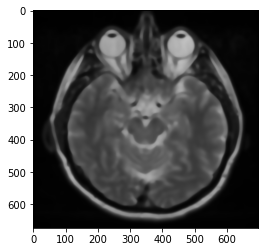

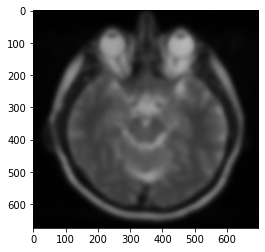

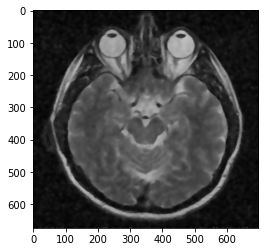

...

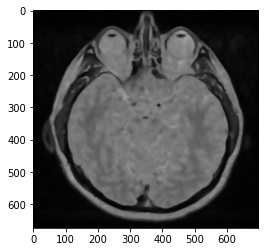

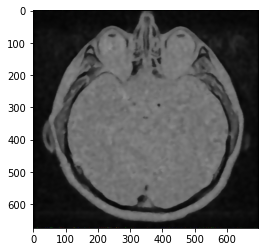

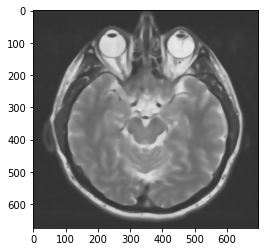

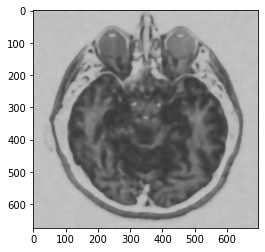

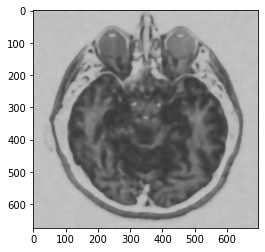

In [ ]:
k = len(img_list)
ref_psnr_values_bilateral = [ ]

for i in range(k):
  bilateral = cv2.bilateralFilter(img_list[i], 15, 75, 75)
  x = peak_signal_noise_ratio(image,bilateral)
  ref_psnr_values_bilateral.append(x)
  plt.figure()
  plt.imshow(bilateral)

plt.show()
  

## Wavelet Domain FIlter

In [ ]:
ref_psnr_values_wavelet

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: As of scikit-image 0.16, automated rescaling of sigma to match any internal rescaling of the image is performed. Setting rescale_sigma to False, will disable this new behaviour. To avoid this warning the user should explicitly set rescale_sigma to True or False.
  
/usr/local/lib/python3.7/dist-packages/skimage/restoration/_denoise.py:850: UserWarning: Wavelet thresholding was designed for use with orthogonal wavelets. For nonorthogonal wavelets such as bior6.8, results are likely to be suboptimal.
  wavelet_levels=wavelet_levels)


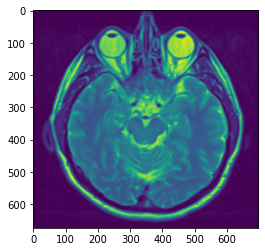

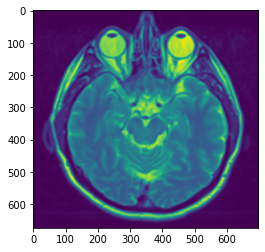

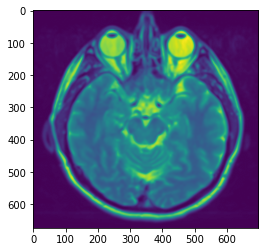

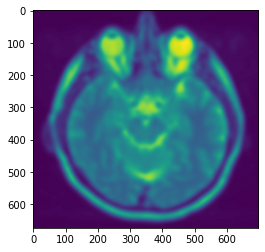

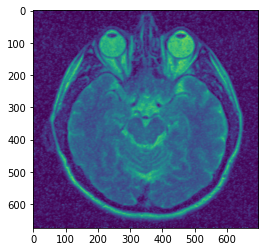

...

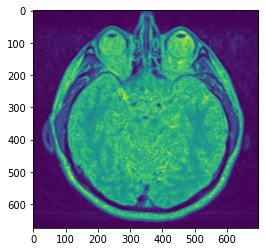

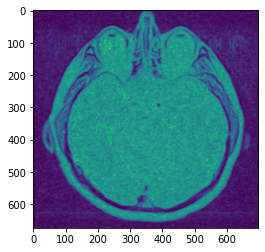

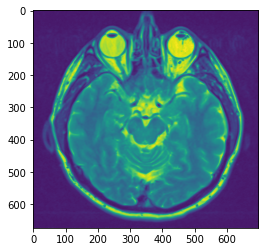

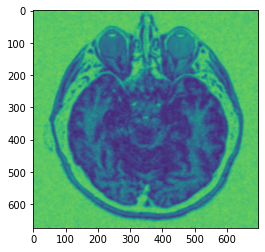

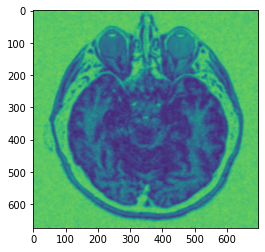

In [ ]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)
k = len(img_list)
ref_psnr_values_wavelet = [ ]

for i in range(k):
  im_bayes = denoise_wavelet(rgb2gray(img_list[i]), method='BayesShrink', mode='soft', wavelet_levels = 3,wavelet = 'bior6.8').astype(np.uint8)
  grayimg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  x = cv2.PSNR(grayimg, im_bayes)
  #x = peak_signal_noise_ratio(rgb2gray(image),im_bayes)
  ref_psnr_values_wavelet.append(x)
  plt.figure()
  plt.imshow(im_bayes)

plt.show()

## Adaptive Median Filter

In [ ]:
def calculate_median(array):
    """Return the median of 1-d array"""
    sorted_array = np.sort(array) #timsort (O(nlogn))
    median = sorted_array[len(array)//2]
    return median

In [ ]:
def level_A(z_min, z_med, z_max, z_xy, S_xy, S_max):
    if(z_min < z_med < z_max):
        return level_B(z_min, z_med, z_max, z_xy, S_xy, S_max)
    else:
        S_xy += 2 #increase the size of S_xy to the next odd value.
        if(S_xy <= S_max): #repeat process
            return level_A(z_min, z_med, z_max, z_xy, S_xy, S_max)
        else:
            return z_med

def level_B(z_min, z_med, z_max, z_xy, S_xy, S_max):
    if(z_min < z_xy < z_max):
        return z_xy
    else:
        return z_med

def amf(image, initial_window, max_window):
    """runs the Adaptive Median Filter proess on an image"""
    xlength, ylength = image.shape #get the shape of the image.
    
    z_min, z_med, z_max, z_xy = 0, 0, 0, 0
    S_max = max_window
    S_xy = initial_window #dynamically to grow
    
    output_image = image.copy()
    
    for row in range(S_xy, xlength-S_xy-1):
        for col in range(S_xy, ylength-S_xy-1):
            filter_window = image[row - S_xy : row + S_xy + 1, col - S_xy : col + S_xy + 1] #filter window
            target = filter_window.reshape(-1) #make 1-dimensional
            z_min = np.min(target) #min of intensity values
            z_max = np.max(target) #max of intensity values
            z_med = calculate_median(target) #median of intensity values
            z_xy = image[row, col] #current intensity
            
            #Level A & B
            new_intensity = level_A(z_min, z_med, z_max, z_xy, S_xy, S_max)
            output_image[row, col] = new_intensity
    return output_image

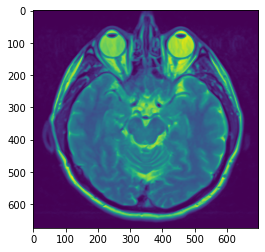

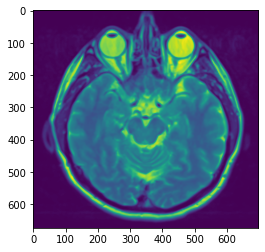

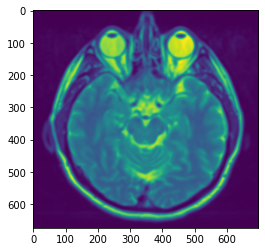

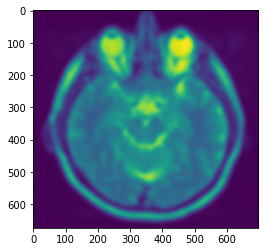

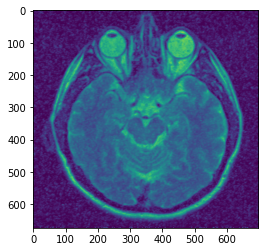

...

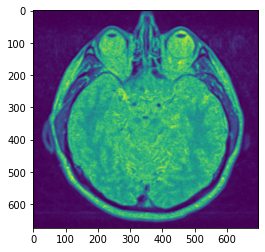

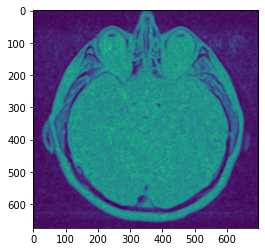

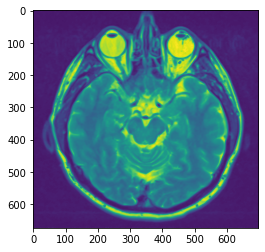

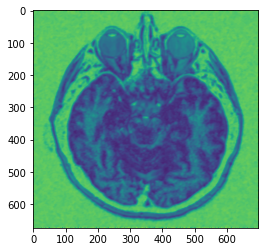

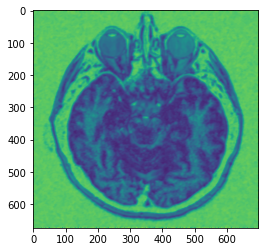

In [ ]:
k = len(img_list)
ref_psnr_values_ad_mean = [ ]

for i in range(k):
  output = amf(rgb2gray(img_list[i]), 3, 11).astype(np.uint8)
  grayimg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  x = cv2.PSNR(grayimg, output)
  ref_psnr_values_ad_mean.append(x)
  
  plt.figure()
  plt.imshow(output)

plt.show()

## Peak Signal To Noise Ratio

In [ ]:
from skimage.metrics import peak_signal_noise_ratio

ref_psnr_values = [ ]
k = len(img_list)
for i in range(k):
  x = peak_signal_noise_ratio(image,img_list[i])
  ref_psnr_values.append(x)


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


In [ ]:
len(ref_psnr_values)

13

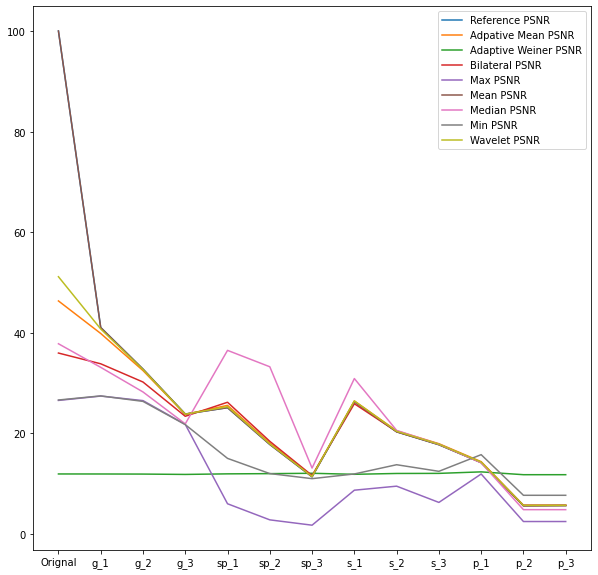

In [92]:
import matplotlib.pyplot as plt
import numpy as np
  
# create data
x = ['Orignal','g_1','g_2','g_3','sp_1','sp_2','sp_3', 's_1', 's_2', 's_3', 'p_1', 'p_2', 'p_3' ]
  
# plot lines
plt.plot(x, ref_psnr_values, label = "Reference PSNR")
plt.plot(x, ref_psnr_values_ad_mean, label = "Adpative Mean PSNR")
plt.plot(x, ref_psnr_values_ad_weiner, label = "Adaptive Weiner PSNR")
plt.plot(x, ref_psnr_values_bilateral, label = "Bilateral PSNR")
plt.plot(x, ref_psnr_values_max, label = "Max PSNR")
plt.plot(x, ref_psnr_values_mean, label = "Mean PSNR")
plt.plot(x, ref_psnr_values_median, label = "Median PSNR")
plt.plot(x, ref_psnr_values_min, label = "Min PSNR")
plt.plot(x, ref_psnr_values_wavelet, label = "Wavelet PSNR")

plt.rcParams['figure.figsize'] = [40, 40]
plt.legend()
plt.show()
